In [2]:
!git clone https://github.com/milarobotlearningcourse/robot_learning_2025.git
%cd robot_learning_2025/hw2
!pip3 install -r requirements.txt

# Install repo
import cv2
import tensorflow_datasets as tfds
import tqdm
import rlds, numpy as np
import mediapy as media
from PIL import Image
from IPython import display

fatal: destination path 'robot_learning_2025' already exists and is not an empty directory.
/content/robot_learning_2025/hw2
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/pip/_internal/cli/base_command.py", line 179, in exc_logging_wrapper
    status = run_func(*args)
             ^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/pip/_internal/cli/req_command.py", line 67, in wrapper
    return func(self, options, args)
           ^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/pip/_internal/commands/install.py", line 447, in run
    conflicts = self._determine_conflicts(to_install)
                ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/pip/_internal/commands/install.py", line 578, in _determine_conflicts
    return check_install_conflicts(to_install)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/pip/_internal/opera

In [ ]:
!pip install mediapy

{'steps': <_VariantDataset element_spec={'action': {'open_gripper': TensorSpec(shape=(), dtype=tf.bool, name=None), 'rotation_delta': TensorSpec(shape=(3,), dtype=tf.float32, name=None), 'terminate_episode': TensorSpec(shape=(), dtype=tf.float32, name=None), 'world_vector': TensorSpec(shape=(3,), dtype=tf.float32, name=None)}, 'is_first': TensorSpec(shape=(), dtype=tf.bool, name=None), 'is_last': TensorSpec(shape=(), dtype=tf.bool, name=None), 'is_terminal': TensorSpec(shape=(), dtype=tf.bool, name=None), 'observation': {'image': TensorSpec(shape=(480, 640, 3), dtype=tf.uint8, name=None), 'natural_language_embedding': TensorSpec(shape=(512,), dtype=tf.float32, name=None), 'natural_language_instruction': TensorSpec(shape=(), dtype=tf.string, name=None), 'state': TensorSpec(shape=(7,), dtype=tf.float32, name=None)}, 'reward': TensorSpec(shape=(), dtype=tf.float32, name=None)}>}
Instruction: Place the can to the left of the pot.


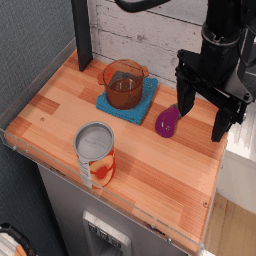

In [3]:
from PIL import Image
from IPython import display
def as_gif(images, path='temp.gif'):
  # Render the images as the gif:
  images = [Image.fromarray(image) for image in images]
  images[0].save(path, save_all=True, append_images=images[1:], duration=1000, loop=0)
  gif_bytes = open(path,'rb').read()
  return gif_bytes

# create RLDS dataset builder
builder = tfds.builder_from_directory(builder_dir='gs://gresearch/robotics/bridge/0.1.0/')
dataset = builder.as_dataset(split='train[:1]')

# sample episode + resize to 256x256 (default third-person cam resolution)
episode = next(iter(dataset))
print(episode)

steps = list(episode['steps'])
images = np.array([cv2.resize(np.array(step['observation']['image']), (256, 256)) for step in steps])

# extract goal image & language instruction
goal_image = images[-1]
language_instruction = steps[0]['observation']['natural_language_instruction'].numpy().decode()

# visualize episode
print(f'Instruction: {language_instruction}')
display.Image(as_gif(images))

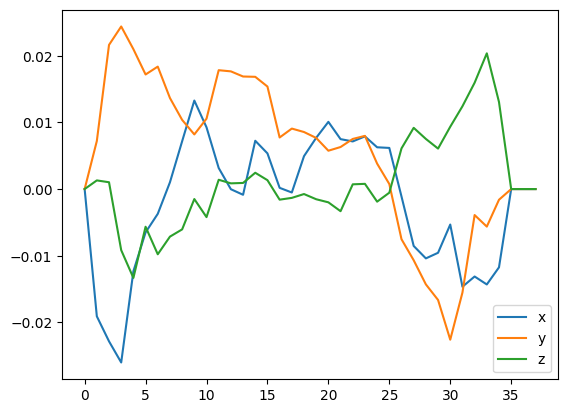

In [4]:
## Looking at the actions
import matplotlib.pyplot as plt

actions = np.array([np.array(step['action']['world_vector']) for step in steps])

plt.plot(actions[:, 0], label='x')
plt.plot(actions[:, 1], label='y')
plt.plot(actions[:, 2], label='z')
plt.legend()
plt.show()

In [5]:
## Install SimpleEnv for evaluation in the simulation
# @title Install vulkan for rendering
!apt-get install -yqq --no-install-recommends libvulkan-dev vulkan-tools
# below fixes some bugs introduced by some recent Colab changes
!mkdir -p /usr/share/vulkan/icd.d
!wget -q -P /usr/share/vulkan/icd.d https://raw.githubusercontent.com/haosulab/ManiSkill/main/docker/nvidia_icd.json
!wget -q -O /usr/share/glvnd/egl_vendor.d/10_nvidia.json https://raw.githubusercontent.com/haosulab/ManiSkill/main/docker/10_nvidia.json

In [6]:
# @title Make sure vulkan is installed correctly
!vulkaninfo | head -n 5

'DISPLAY' environment variable not set... skipping surface info
error: XDG_RUNTIME_DIR not set in the environment.
VULKANINFO

Vulkan Instance Version: 1.3.204


In [7]:
!git clone https://github.com/milarobotlearningcourse/SimplerEnv.git --recurse-submodules
!pip install -e ./SimplerEnv/ManiSkill2_real2sim/
!pip install -e ./SimplerEnv
!mkdir ./SimplerEnv/checkpoints

Cloning into 'SimplerEnv'...
remote: Enumerating objects: 1570, done.
remote: Counting objects: 100% (1/1), done.
remote: Total 1570 (delta 0), reused 0 (delta 0), pack-reused 1569 (from 2)
Receiving objects: 100% (1570/1570), 16.89 MiB | 18.39 MiB/s, done.
Resolving deltas: 100% (1104/1104), done.
Submodule 'ManiSkill2_real2sim' (https://github.com/simpler-env/ManiSkill2_real2sim) registered for path 'ManiSkill2_real2sim'
Cloning into '/content/robot_learning_2025/hw2/SimplerEnv/ManiSkill2_real2sim'...
remote: Enumerating objects: 3451, done.        
remote: Counting objects: 100% (65/65), done.        
remote: Compressing objects: 100% (29/29), done.        
remote: Total 3451 (delta 49), reused 36 (delta 36), pack-reused 3386 (from 2)        
Receiving objects: 100% (3451/3451), 188.76 MiB | 34.88 MiB/s, done.
Resolving deltas: 100% (1833/1833), done.
remote: Enumerating objects: 6, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (2/2), done.
remo

In [8]:
import sys
sys.path.append('/content/robot_learning_2025/hw2/SimplerEnv')  # Adjust path if needed
sys.path.append('/content/robot_learning_2025/hw2/SimplerEnv/ManiSkill2_real2sim')

import simpler_env
from simpler_env.utils.env.observation_utils import get_image_from_maniskill2_obs_dict
print("SimplerEnv successfully imported!")


SimplerEnv successfully imported!


/usr/local/lib/python3.11/dist-packages/gymnasium/core.py:311: UserWarning: WARN: env.get_language_instruction to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.get_language_instruction` for environment variables or `env.get_wrapper_attr('get_language_instruction')` that will search the reminding wrappers.
  logger.warn(
/usr/local/lib/python3.11/dist-packages/gymnasium/core.py:311: UserWarning: WARN: env.robot_uid to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.robot_uid` for environment variables or `env.get_wrapper_attr('robot_uid')` that will search the reminding wrappers.
  logger.warn(


Reset info {'scene_name': 'bridge_table_1_v1', 'scene_offset': None, 'scene_pose': None, 'scene_table_height': 0.87, 'urdf_version': '', 'rgb_overlay_path': '/content/robot_learning_2025/hw2/SimplerEnv/ManiSkill2_real2sim/data/real_inpainting/bridge_real_eval_1.png', 'rgb_overlay_cameras': ['3rd_view_camera'], 'rgb_overlay_mode': 'background', 'disable_bad_material': False, 'episode_model_ids': ['bridge_carrot_generated_modified', 'bridge_plate_objaverse_larger'], 'episode_model_scales': [1.0, 1.0], 'episode_source_obj_name': 'bridge_carrot_generated_modified', 'episode_target_obj_name': 'bridge_plate_objaverse_larger', 'episode_source_obj_init_pose_wrt_robot_base': Pose([0.381995, 0.104536, 0.0175282], [-0.706719, 0.0305475, -0.0305745, -0.706173]), 'episode_target_obj_init_pose_wrt_robot_base': Pose([0.382, -0.047, -0.000468433], [-6.55451e-07, -5.10228e-07, -1.6917e-06, -1]), 'episode_id': 1}
Instruction put carrot on plate
Episode stats OrderedDict([('moved_correct_obj', False), ('

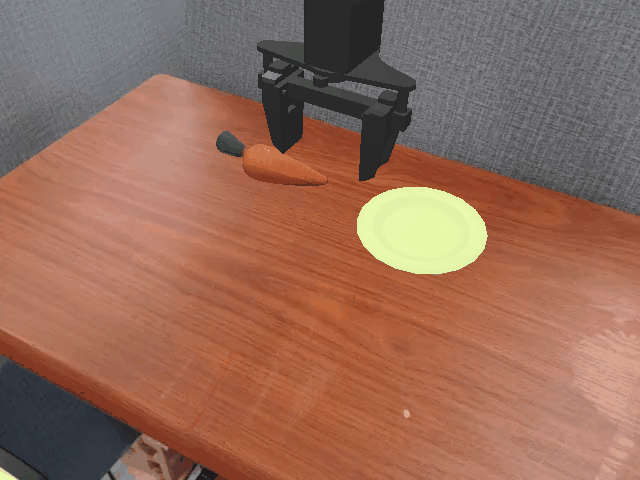

In [7]:
import simpler_env
from simpler_env.utils.env.observation_utils import get_image_from_maniskill2_obs_dict
import mediapy
import sapien.core as sapien
import matplotlib.pyplot as plt

task_name = "widowx_carrot_on_plate"  # @param ["google_robot_pick_coke_can", "google_robot_move_near", "google_robot_open_drawer", "google_robot_close_drawer", "widowx_spoon_on_towel", "widowx_carrot_on_plate", "widowx_stack_cube", "widowx_put_eggplant_in_basket"]

if 'env' in locals():
  print("Closing existing env")
  env.close()
  del env
env = simpler_env.make(task_name)
# Colab GPU does not support denoiser
sapien.render_config.rt_use_denoiser = False
obs, reset_info = env.reset()
instruction = env.get_language_instruction()
print("Reset info", reset_info)
print("Instruction", instruction)

frames = []
done, truncated = False, False
while not (done or truncated):
   # action[:3]: delta xyz; action[3:6]: delta rotation in axis-angle representation;
   # action[6:7]: gripper (the meaning of open / close depends on robot URDF)
   image = get_image_from_maniskill2_obs_dict(env, obs)
   action = env.action_space.sample() # replace this with your policy inference
   obs, reward, done, truncated, info = env.step(action)
   frames.append(image)

episode_stats = info.get('episode_stats', {})
print("Episode stats", episode_stats)
# mediapy.show_video(frames, fps=10)
import moviepy.editor as mpy
clip = mpy.ImageSequenceClip(list(frames), fps=20)
display.Image(as_gif(frames))

In [10]:
from hydra import compose, initialize
initialize(config_path="./conf", job_name="test_app")

ValueError: mutable default <class 'hydra.conf.JobConf.JobConfig.OverrideDirname'> for field override_dirname is not allowed: use default_factory

In [12]:
!find /usr/local/lib/python3.11/ -name "JobConf.py"


In [22]:
import torch
import torch.nn as nn
from torch.nn import functional as F
from torch.optim import Adam
from torch.nn import CrossEntropyLoss
from torch.utils.data import DataLoader

import tensorflow_datasets as tfds
import numpy as np
from tqdm import tqdm, trange
import cv2


# data loading
def get_batch_grp(split, dataset, batch_size):
    # generate a small batch of inputs x and targets y
    data = dataset['train'] if split == 'train' else dataset['test']
    ix = np.random.randint(int(len(data["img"])), size=(batch_size,))
    x = torch.tensor(data["img"][ix], dtype=torch.float)
    x_goal = torch.tensor(data["goal"][ix], dtype=torch.long)
    x_goal_img = torch.tensor(data["goal_img"][ix], dtype=torch.float)
    y = torch.tensor(data["action"][ix], dtype=torch.float)
    return x, x_goal, x_goal_img, y


@torch.no_grad()
def estimate_loss(model):
    out = {}
    model.eval()
    for split in ['train', 'val']:
        losses = torch.zeros(model._cfg["eval_iters"])
        for k in range(model._cfg["eval_iters"]):
            X, x_goal, x_goal_img, Y = get_batch_grp(split, model._dataset, model._cfg["batch_size"])
            logits, loss = model(X, x_goal, x_goal_img, Y)
            losses[k] = loss.item()
        out[split] = losses.mean()
    model.train()
    return out

def get_patches_fast(images):
    from einops import rearrange
    batch_size, channels, height, width = images.shape
    patch_size = height // 8 ## n_patches = 8

    patches = rearrange(images, 'b (h p1) (w p2) c -> b (h w) (p1 p2 c)', p1 = patch_size, p2 = patch_size)
    return patches

def calc_positional_embeddings(sequence_length, d):
    result = torch.ones(sequence_length, d)
    for i in range(sequence_length):
        for j in range(d):
            result[i][j] = np.sin(i / (10000 ** (j / d))) if j % 2 == 0 else np.cos(i / (10000 ** ((j - 1) / d)))
    return result

## This is an encoder head (full attention)
class Head(nn.Module):
    """ one head of self-attention """

    def __init__(self, head_size, n_embd, dropout):
        super().__init__()
        self.key = nn.Linear(n_embd, head_size, bias=False)
        self.query = nn.Linear(n_embd, head_size, bias=False)
        self.value = nn.Linear(n_embd, head_size, bias=False)
        # self.register_buffer('tril', torch.tril(torch.ones(block_size, block_size)))

        self.dropout = nn.Dropout(dropout)

    def forward(self, x, mask=None):
        B,T,C = x.shape

        k = self.key(x)   # (B,T,C)
        q = self.query(x) # (B,T,C)
        # compute attention scores ("affinities")
        wei = q @ k.transpose(-2,-1) * C**-0.5 # (B, T, C) @ (B, C, T) -> (B, T, T)
        ### Block masked attention
        if mask is not None:
            wei = wei.masked_fill(mask == 0, float('-inf'))

        wei = F.softmax(wei, dim=-1) # (B, T, T)
        wei = self.dropout(wei)
        # perform the weighted aggregation of the values
        v = self.value(x) # (B,T,C)
        out = wei @ v # (B, T, T) @ (B, T, C) -> (B, T, C)
        return out

class MultiHeadAttention(nn.Module):
    """ multiple heads of self-attention in parallel """

    def __init__(self, num_heads, head_size, n_embd, dropout):
        super().__init__()
        self.heads = nn.ModuleList([Head(head_size, n_embd=n_embd, dropout=dropout) for _ in range(num_heads)])
        self.proj = nn.Linear(n_embd, n_embd)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x, mask=None):
        out = torch.cat([h(x, mask) for h in self.heads], dim=-1)
        out = self.dropout(self.proj(out))
        return out

class FeedFoward(nn.Module):
    """ a simple linear layer followed by a non-linearity """

    def __init__(self, n_embd, dropout):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(n_embd, 4 * n_embd),
            nn.ReLU(),
            nn.Linear(4 * n_embd, n_embd),
            nn.Dropout(dropout),
        )

    def forward(self, x):
        return self.net(x,)

class Block(nn.Module):
    """ Transformer block: communication followed by computation """

    def __init__(self, n_embd, n_head, dropout):
        # n_embd: embedding dimension, n_head: the number of heads we'd like
        super().__init__()
        head_size = n_embd // n_head
        self.sa = MultiHeadAttention(n_head, head_size, n_embd=n_embd, dropout=dropout)
        self.ffwd = FeedFoward(n_embd, dropout)
        self.ln1 = nn.LayerNorm(n_embd)
        self.ln2 = nn.LayerNorm(n_embd)

    def forward(self, x, mask=None):
        x = x + self.sa(self.ln1(x), mask)
        x = x + self.ffwd(self.ln2(x))
        return x

class GRP(nn.Module):
    def __init__(self, dataset, cfg, mlp_ratio=4):
        super(GRP, self).__init__()
        self._dataset = dataset
        self._cfg = cfg

        self.image_embedding = nn.Linear(cfg["image_patch_dim"], cfg["hidden_dim"])
        self.text_embedding = nn.Embedding(cfg["vocab_size"], cfg["hidden_dim"])
        self.goal_image_embedding = nn.Linear(cfg["image_patch_dim"], cfg["hidden_dim"])

        # Calculate extra tokens based on observed mismatch
        extra_tokens = 106  # Adjust based on dataset-specific token length difference

        # Fix positional embedding size to match token concatenation
        self.pos_embedding = nn.Parameter(torch.randn(1, cfg["max_seq_len"] + extra_tokens, cfg["hidden_dim"]))


        self.transformer_blocks = nn.Sequential(
            *[Block(cfg["hidden_dim"], cfg["n_heads"], cfg["dropout"]) for _ in range(cfg["n_layers"])]
        )

        self.output_head_discrete = nn.Linear(cfg["hidden_dim"], cfg["num_classes"])
        self.output_head_continuous = nn.Linear(cfg["hidden_dim"], cfg["action_dim"])

    def _init_weights(self, module):
        if isinstance(module, nn.Linear):
            torch.nn.init.normal_(module.weight, mean=0.0, std=0.02)
            if module.bias is not None:
                torch.nn.init.zeros_(module.bias)
        elif isinstance(module, nn.Embedding):
            torch.nn.init.normal_(module.weight, mean=0.0, std=0.02)

    def forward(self, images, goals_txt, goal_imgs, targets=None):
        n, c, h, w = images.shape
        B, T = goals_txt.shape

        image_tokens = self.image_embedding(get_patches_fast(images))
        text_tokens = self.text_embedding(goals_txt)
        goal_image_tokens = self.goal_image_embedding(get_patches_fast(goal_imgs))

        tokens = torch.cat([image_tokens, text_tokens, goal_image_tokens], dim=1)
        tokens += self.pos_embedding[:, :tokens.shape[1], :]

        transformed_tokens = self.transformer_blocks(tokens)
        final_token = transformed_tokens[:, 0, :]

        if self._cfg["action_space"] == "discrete":
            logits = self.output_head_discrete(final_token)
            loss = CrossEntropyLoss()(logits, targets) if targets is not None else None
        else:
            logits = self.output_head_continuous(final_token)
            loss = F.mse_loss(logits, targets) if targets is not None else None

        return logits, loss


In [39]:
cfg = load_config("/content/robot_learning_2025/hw2/conf/bridge-64-light.yaml")

In [ ]:
  # Load YAML config

torch.manual_seed(cfg["r_seed"])
print("cfg:", json.dumps(cfg, indent=4))  # Print config in readable format

# Manually set logging directory
log_dir = os.path.join(os.getcwd(), "logs")
os.makedirs(log_dir, exist_ok=True)

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print("Using device:", device, f"({torch.cuda.get_device_name(device)})" if torch.cuda.is_available() else "")
cfg["device"] = device

dataset = load_dataset(cfg["dataset"]["to_name"], split='train')
print('Features:', dataset.features)

dataset_tmp = {
        "img": np.array(dataset["img"]),
        "action": np.concatenate((np.array(dataset["action"]),
                                  np.array(dataset["rotation_delta"]),
                                  np.array(dataset["open_gripper"])), axis=1),
        "goal_img": np.array(dataset["goal_img"]),
        "goal": dataset["goal"]
    }

In [ ]:
import wandb

In [ ]:
import wandb
wandb.login(relogin=True)

In [ ]:
import json
import yaml
import os
import torch
import numpy as np
from datasets import load_dataset, load_from_disk

def load_config(config_path="config.yaml"):
    with open(config_path, "r") as f:
        return yaml.safe_load(f)

def my_main(dataset_tmp):

    shortest_text_len = min([len(txt) for txt in dataset["goal"]])
    cfg["block_size"] = shortest_text_len

    # Here are all the unique characters that occur in this text
    chars = sorted(list(set([item for row in dataset_tmp["goal"] for item in row])))  # Flatten to a long string
    cfg["vocab_size"] = len(chars)

    # Create a mapping from characters to integers
    stoi = {ch: i for i, ch in enumerate(chars)}
    itos = {i: ch for i, ch in enumerate(chars)}
    encode_txt = lambda s: [stoi[c] for c in s]  # Text encoder to tokens
    decode_txt = lambda l: ''.join([itos[i] for i in l])  # Token decoder to text

    print("vocab_size:", cfg["vocab_size"])
    print("example text encode:", encode_txt(dataset_tmp["goal"][0]))

    # TODO:
    ## Provide the logic for the GRP policy for discretized or continuous actions
    if cfg["action_space"] == "discrete":
        encode_action = lambda actions: torch.tensor(actions, dtype=torch.long)  # Convert actions to int64
        decode_action = lambda logits: torch.argmax(logits, dim=-1).cpu().numpy()  # Get highest probability action
    else:
        encode_action = lambda actions: torch.tensor(np.clip(actions, -1, 1), dtype=torch.float)  # Normalize to [-1,1]
        decode_action = lambda logits: torch.tensor(logits).clip(-1, 1).cpu().numpy()


    # Get the actions and encode them to map to [-1, 1]
    encode_state = lambda af: ((af / 255.0 * 2.0) - 1.0).astype(np.float32)  # Encoder: take a float, output an integer
    resize_state = lambda sf: cv2.resize(np.array(sf, dtype=np.float32), (cfg["image_shape"][0], cfg["image_shape"][1]))  # Resize state

    dataset_tmp = {
        "img": torch.tensor(encode_state(dataset_tmp["img"])).to(device),
        "action": torch.tensor(encode_action(dataset_tmp["action"]), dtype=torch.float).to(device),
        "goal_img": torch.tensor(encode_state(dataset_tmp["goal_img"])).to(device),
        "goal": torch.tensor([encode_txt(goal[:cfg["block_size"]]) for goal in dataset_tmp["goal"]]).to(device)
    }

    print("Dataset shape:", len(dataset_tmp["img"]))
    dataset_tmp = {"train": dataset_tmp, "test": dataset_tmp}

    if not cfg["testing"]:
        import wandb
        # Start a new wandb run to track this script
        wandb.init(
            # Set the wandb project where this run will be logged
            project=cfg["experiment"]["project"],

            # Track hyperparameters and run metadata
            config=cfg
        )
        wandb.run.log_code(".")

    model = GRP(dataset_tmp, cfg)
    m = model.to(device)
    print(sum(p.numel() for p in m.parameters()) / 1e6, 'M parameters')

    # Create a PyTorch optimizer
    optimizer = torch.optim.AdamW(model.parameters(), lr=float(cfg["learning_rate"]))
    import torch.optim.lr_scheduler as lr_scheduler
    scheduler = lr_scheduler.LinearLR(optimizer, start_factor=1.0, end_factor=0.1, total_iters=int(cfg["max_iters"]))

    if cfg["simEval"]:
        print("meow")
        import simpler_env
        from simpler_env.utils.env.observation_utils import get_image_from_maniskill2_obs_dict

        task_name = "widowx_carrot_on_plate"
        if 'env' in locals():
            print("Closing existing env")
            env.close()
            del env

        env = simpler_env.make(task_name)
        env_unwrapped = env.env.env.env  # Updated gymnasium wrapper adds lots of wrappers.

    for iter in range(int(cfg["max_iters"])):

        if iter % int(cfg["eval_interval"]) == 0 or iter == int(cfg["max_iters"]) - 1:
            losses = estimate_loss(model)
            print(f"step {iter}: train loss {losses['train']:.4f}, val loss {losses['val']:.4f}")
            if not cfg["testing"]:
                wandb.log({"train loss": losses['train'], "val loss": losses['val']})
            if cfg["simEval"] and (iter % cfg["eval_vid_iters"] == 0):  ## Do this eval infrequently because it takes a fair bit of compute
              rewards = []
              for j in range(cfg["sim"]["eval_episodes"]):  ## Better to eval over a few different goal configurations
                  obs, reset_info = env.reset()
                  instruction = env_unwrapped.get_language_instruction()
                  print("Reset info", reset_info)
                  print("Instruction", instruction)
                  frames = []
                  done, truncated, timeLimit, t = False, False, 100, 0
                  while not (done or truncated or (t > timeLimit)):
                      # action[:3]: delta xyz; action[3:6]: delta rotation in axis-angle representation;
                      # action[6:7]: gripper (the meaning of open / close depends on robot URDF)
                      image = get_image_from_maniskill2_obs_dict(env_unwrapped, obs)
                      image = image[:, :, :3]  ## Remove last dimension of image color
                      action, loss = model.forward(
                          torch.tensor(np.array([encode_state(resize_state(image))])).to(device),
                          torch.tensor(np.array([encode_txt(instruction)[:cfg["block_size"]]])).to(device),  ## There can be issues here if the text is shorter than any example in the dataset
                          torch.tensor(np.array([encode_state(resize_state(image))])).to(device),  ## Not the correct goal image... Should mask this.
                      )
                      # action = env.action_space.sample() # replace this with your policy inference
                      if cfg["load_action_bounds"]:
                          action = decode_action(action.cpu().detach().numpy()[0])  ## Add in the gripper close action
                      else:
                          action = np.concatenate((decode_action(action.cpu().detach().numpy()[0]), [0]), axis=-1)  ## Add in the gripper close action
                      obs, reward, done, truncated, info = env.step(action)
                      reward = -np.linalg.norm(info["eof_to_obj1_diff"])
                      frames.append(image)
                      rewards.append(reward)
                      t = t + 1

              episode_stats = info.get("episode_stats", {})
              print("Episode stats", episode_stats)
              print(f"avg reward {np.mean(rewards):.8f}")
              if not cfg["testing"]:
                  wandb.log({"avg reward": np.mean(rewards)})

              import moviepy.editor as mpy
              clip = mpy.ImageSequenceClip(list(frames), fps=20)
              clip.write_videofile(log_dir + "/sim-env-" + str(iter) + ".mp4", fps=20)

              if not cfg["testing"]:
                  wandb.log({"example": wandb.Video(log_dir + "/sim-env-" + str(iter) + ".mp4")})

        xb, xg, xgi, yb = get_batch_grp('train', dataset_tmp, cfg["batch_size"])

        # Evaluate the loss
        logits, loss = model(xb, xg, xgi, yb)
        loss.backward()

        if (iter + 1) % cfg["gradient_accumulation_steps"] == 0:
            optimizer.step()
            optimizer.zero_grad(set_to_none=True)

    if not cfg["testing"]:
        wandb.finish()

    return losses['val']


if __name__ == "__main__":
    results = my_main(dataset_tmp)
    print("results:", results)


vocab_size: 51
example text encode: [18, 37, 26, 28, 30, 0, 45, 33, 30, 0, 28, 26, 39, 0, 45, 40, 0, 45, 33, 30, 0, 37, 30, 31, 45, 0, 40, 31, 0, 45, 33, 30, 0, 41, 40, 45, 2]


  "action": torch.tensor(encode_action(dataset_tmp["action"]), dtype=torch.float).to(device),



Dataset shape: 3505
